### 2D, 2.5D and 3D convolutions to  medical volume by PyTorch. 

PyTorch offers the functionality of computing convolutions with arbitrary kernel sizes, and handles all the mechanics of striding and padding

In [3]:
import pydicom
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy.ma as ma
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import nibabel as nib
from PIL import Image
import math

plt.rcParams["figure.figsize"] = (7,7)

## Convolutional filters


In [51]:
# Define a 4x4 edge filter kernel

conv_kernel = np.ones((4,4))
conv_kernel[2:,:] = -1
print(conv_kernel)

# Torch's convolutional layer for oconvolutional filter operation

conv2d = nn.Conv2d(
    1, # Input size == 1 (1 input channel)
    1, # Output size - get 1 channel as an output
    kernel_size = (4, 4), # size of filter kernel
    bias = False) # do not need a bias for this operation
conv2d

[[ 1.  1.  1.  1.]
 [ 1.  1.  1.  1.]
 [-1. -1. -1. -1.]
 [-1. -1. -1. -1.]]


Conv2d(1, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)

In [52]:
# turn convolutional kernel into a tensor which can be used to initialize our convolutional layer

params = torch.from_numpy(conv_kernel).type(torch.FloatTensor).unsqueeze(0).unsqueeze(0)

# unsqeeze operation - adding empty dimensions to the vector bringing it to 4 dimensions
# Torch expects parameter vector of size (output_channels, input_channels, kernel x dimension, kernel y dimension)

conv2d.weight = torch.nn.Parameter(params)

In [53]:
params.shape

torch.Size([1, 1, 4, 4])

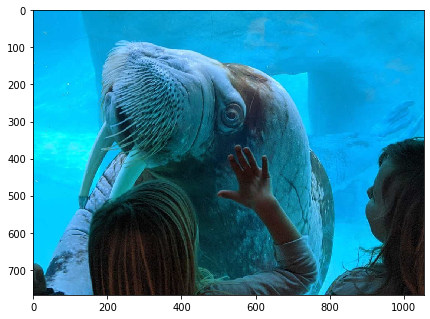

In [54]:
# load an image 
walrus = Image.open('data3Dconvolutions/walrus.jpg')
plt.imshow(walrus)

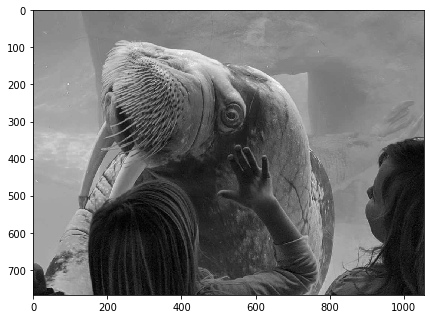

In [55]:
# convert it to grayscale and normalize 
walrus = walrus.convert("L")
walrus = np.array(walrus)
walrus = walrus.astype(np.single)/0xff

plt.imshow(walrus, cmap="gray")

In [56]:
# Conv2D layer is expecting a 4D tensor (batch_size, channels, width, height)
# Bring the walrus into proper shape

walrus_tensor = torch.from_numpy(walrus).unsqueeze(0).unsqueeze(1)
walrus_tensor.shape

torch.Size([1, 1, 768, 1054])

Wall time: 44 ms


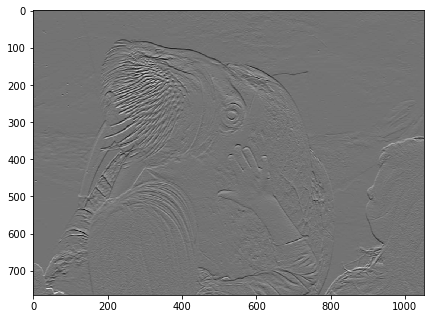

In [57]:
%%time
# Let's compute the convolution map and ReLU activations

convolved = conv2d(walrus_tensor)
relu = F.relu(convolved)

# visualize
plt.imshow(np.squeeze(convolved.detach().numpy()), cmap="gray")

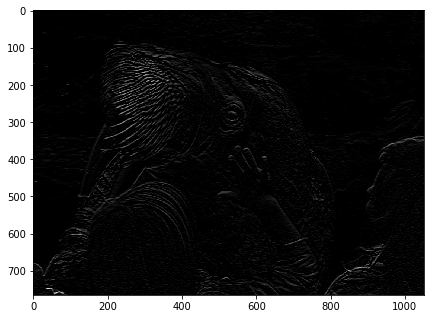

In [58]:
plt.imshow(np.squeeze(relu.detach().numpy()), cmap="gray")

### medical applications
## Loading a NIFTI volume


(512, 512, 41)


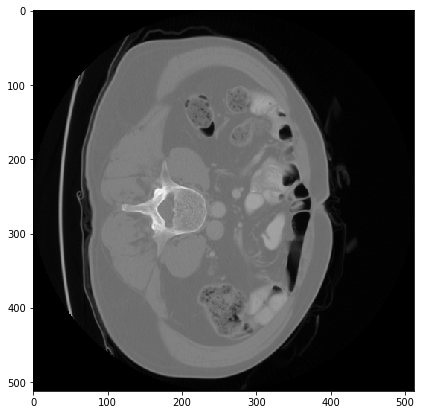

In [59]:
# load our image

nii_img = nib.load("data3Dconvolutions/spleen.nii.gz")
img = nii_img.get_fdata()
print(img.shape)

# visualize a slice:

plt.imshow(img[:,:,0], cmap="gray")

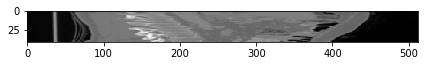

In [60]:
# visualize sagittal cross-section at cut 250 (use rot90 to orient the image )

plt.imshow(np.rot90(img[250,:,:]), cmap = "gray")

squished

In [61]:
nii_img.header["pixdim"]

array([1.      , 0.744141, 0.744141, 5.      , 0.      , 0.      ,
       0.      , 0.      ], dtype=float32)

Values at locations 1, 2 and 3 are x, y and z dimensions respectively.

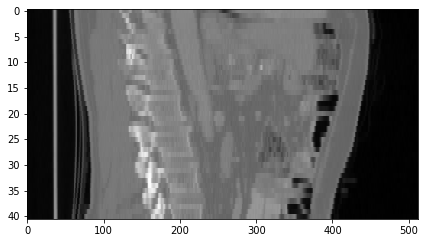

In [62]:
img2d = np.rot90(img[250,:,:])
plt.imshow(img2d, cmap = "gray", aspect=nii_img.header["pixdim"][3]/nii_img.header["pixdim"][1])

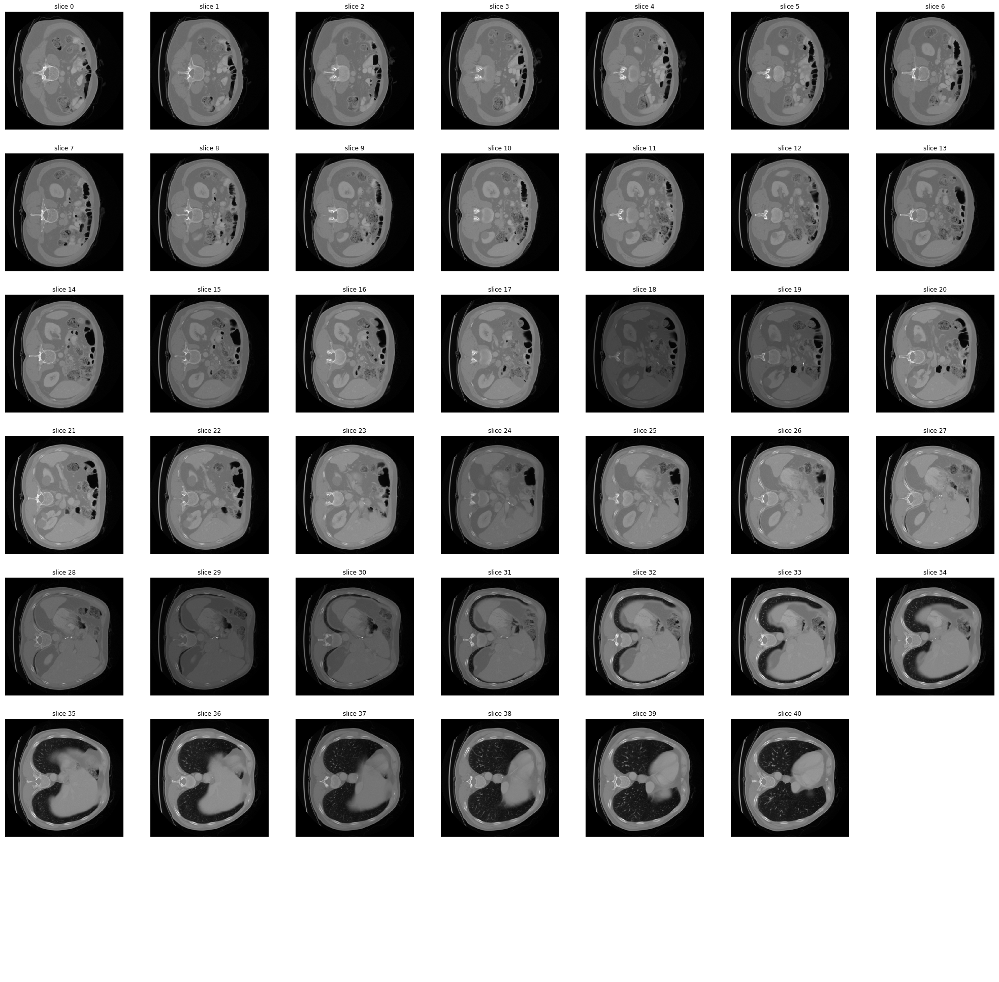

In [63]:
# Wvisualize all slices in a grid as thumbnails:

def display_volume_slices(img, w, h):
    plot_w = w
    plot_h = h

    # You can play with figsize parameter to adjust how large the images are
    fig, ax = plt.subplots(plot_h, plot_w, figsize=[35,35])

    for i in range(plot_w*plot_h):
        plt_x = i % plot_w
        plt_y = i // plot_w
        if (i < len(img)):
            ax[plt_y, plt_x].set_title(f"slice {i}")
            ax[plt_y, plt_x].imshow(img[i], cmap='gray')
        ax[plt_y, plt_x].axis("off")

    plt.show()

display_volume_slices(np.transpose(img, (2, 0, 1)), 7, 7)

---
## 2D Convolutions

use the "2D Convolution"  to create a volume of convolution maps for all of the slices in volume

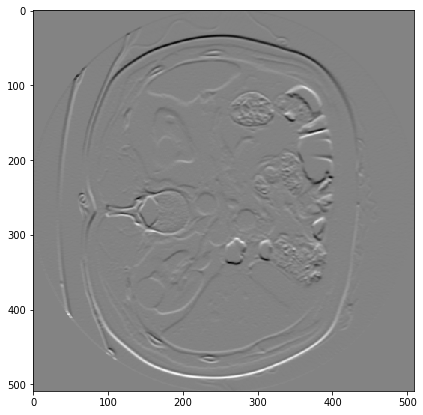

In [64]:
# reuse the convolutional layer defined above 
conv_slices = []

for ix in range(0, img.shape[2]):
    slice_tensor = torch.from_numpy((img[:,:,ix].astype(np.single)/0xff)).unsqueeze(0).unsqueeze(1)
    convolved = conv2d(slice_tensor)
    conv_slices.append(np.squeeze(convolved.detach().numpy()))

plt.imshow(conv_slices[20], cmap="gray")

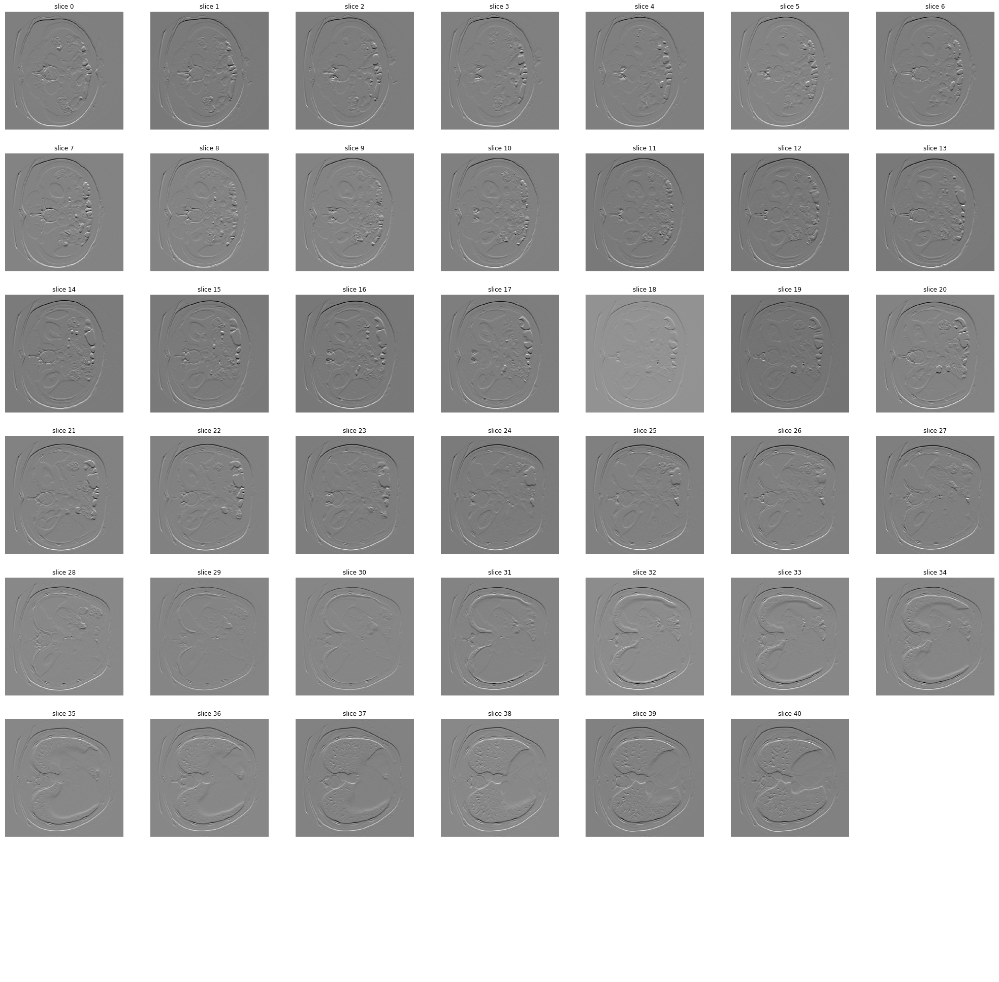

In [65]:
# visualize the slices

display_volume_slices(conv_slices, 7, 7)

In [66]:
#parameter vector 
conv2d.weight.shape

torch.Size([1, 1, 4, 4])

In [67]:
print(f"Number of trainable parameters: {np.prod(conv2d.weight.shape)}")


Number of trainable parameters: 16


# 3D Convolutions
compute full 3D convolutions by using PyTorch's Conv3D layer

Conv3d(1, 1, kernel_size=(4, 4, 4), stride=(1, 1, 1), bias=False)
(4, 4, 4)
torch.Size([1, 1, 4, 4, 4])
torch.Size([1, 1, 512, 512, 41])
torch.float32
torch.Size([1, 1, 509, 509, 38])
(38, 509, 509)


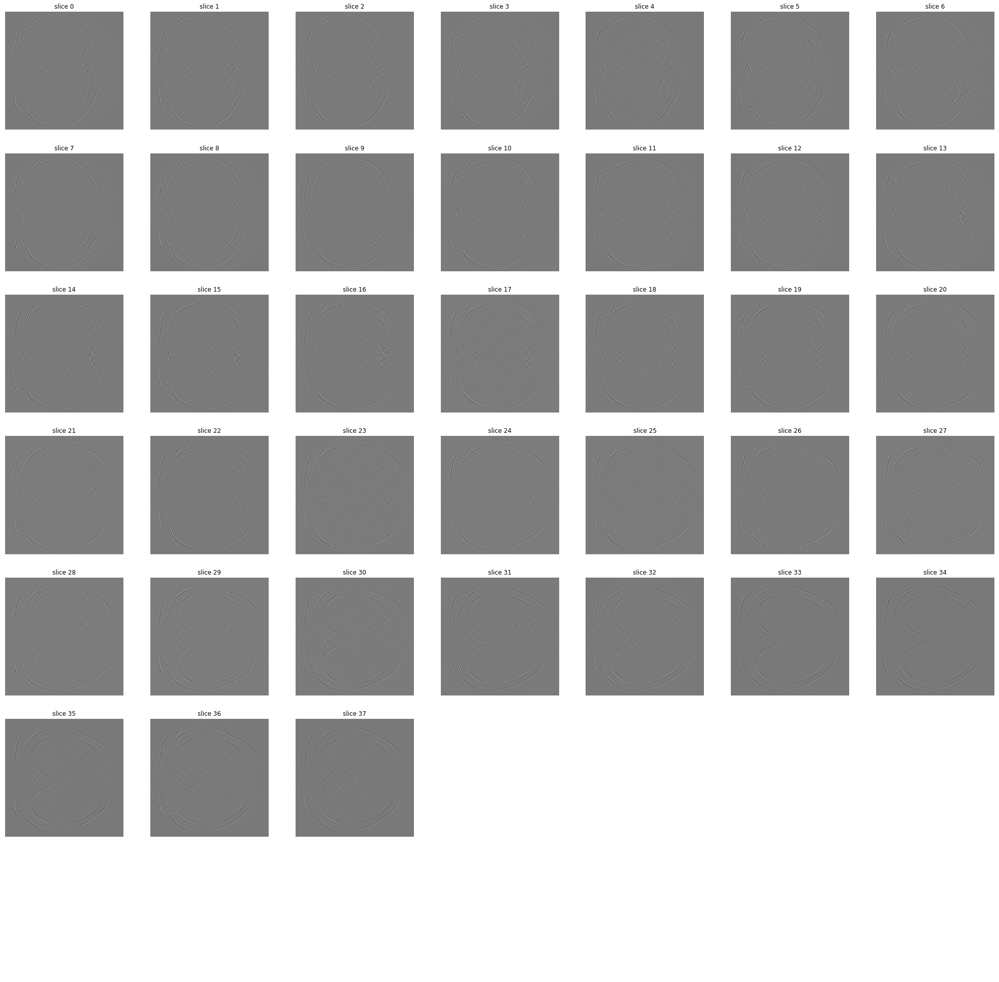

In [69]:
conv3d = nn.Conv3d(
    1, # Input size == 1 
    1, # Output size 
    kernel_size = (4, 4, 4), 
    bias = False) 
print(conv3d)

# Build the kernel
conv_kernel3d = np.array([conv_kernel, conv_kernel, -conv_kernel, -conv_kernel])
print(conv_kernel3d.shape)

#weights
print(conv3d.weight.shape)

# Set up weights
params3d = torch.from_numpy(conv_kernel3d).type(torch.FloatTensor).unsqueeze(0).unsqueeze(0) 
conv3d.weight = torch.nn.Parameter(params3d)

# Convert image to tensor that works for our conv3d filter
conv_tensor = torch.from_numpy((img.astype(np.single)/0xff)).unsqueeze(0).unsqueeze(1)
print(conv_tensor.shape)

print(conv_tensor.dtype)

# Run convolution
convolved = conv3d(conv_tensor)
print(convolved.shape)

convolved_np = np.transpose(np.squeeze(convolved.detach().numpy()), (2, 0, 1))
print(convolved_np.shape)

display_volume_slices(convolved_np, 7, 7)

In [70]:
print(f"Number of trainable parameters: {np.prod(conv3d.weight.shape)}")

Number of trainable parameters: 64


# 2.5D Convolutions

In [71]:
patch_size = 16

# extract patch_size square patches from 3D img across cardinal planes with center in the 
# middle of each patch and put them into (num_patches, 3, patch_size, patch_size) numpy array
# It assumes that img.shape is divisible by patch_size for the sake of simplicity 

def extract_patches(img, patch_size, z_level):
    
    # create holder array
    num_patches = (img.shape[0]//patch_size) * (img.shape[1]//patch_size)
    out = np.zeros((num_patches, 3, patch_size, patch_size))
    
    for p_x in range(0,img.shape[0]//patch_size):
        for p_y in range(0,img.shape[1]//patch_size):
            
            # Figure out where the patch should start in our main plane
            patch_start_x = p_x*patch_size
            patch_end_x = patch_start_x + patch_size
            x_center = patch_start_x + patch_size//2

            patch_start_y = p_y*patch_size
            patch_end_y = patch_start_y + patch_size
            y_center = patch_start_y + patch_size//2

            # Figure out where patch starts in ortho planes. 
            # since extract patches in orthogonal direction, indices might go over or negative
            patch_start_z = max(0, z_level-patch_size//2)
            patch_end_z = patch_start_z + patch_size

            if (patch_end_z >= img.shape[2]):
                patch_end_z -= patch_end_z - img.shape[2]
                patch_start_z = patch_end_z - patch_size

            # Get axial, sagittal and coronal slices, assuming particular arrangement of respective planes in the 
            # input image
            patch_a = img[patch_start_x:patch_end_x, patch_start_y:patch_end_y, z_level]
            patch_s = img[x_center, patch_start_y:patch_end_y, patch_start_z:patch_end_z]
            patch_c = img[patch_start_x:patch_end_x, y_center, patch_start_z:patch_end_z]

            patch_id = p_x*img.shape[0]//patch_size + p_y
            out[patch_id] = np.array([patch_a, patch_s, patch_c])
        
    return out

In [72]:
# rebuild image from patches, assuming square patches contribute to square image
def build_slice_from_patches(patches):
    img_size = int(math.sqrt(patches.shape[0]))*patches.shape[1]

    out = np.zeros((img_size, img_size))
    
    for i in range(patches.shape[0]):
        x = i // (out.shape[0] // patches.shape[2]) 
        y = i % (out.shape[0] // patches.shape[2]) 

        x_start = x*patches.shape[2]
        x_end = x_start + patches.shape[2]

        y_start = y*patches.shape[2]
        y_end = y_start + patches.shape[2]

        out[x_start:x_end, y_start:y_end] = patches[i]
        
    return out

In [73]:
# Test 
patches = extract_patches(img, patch_size, 40)
patches.shape

(1024, 3, 16, 16)

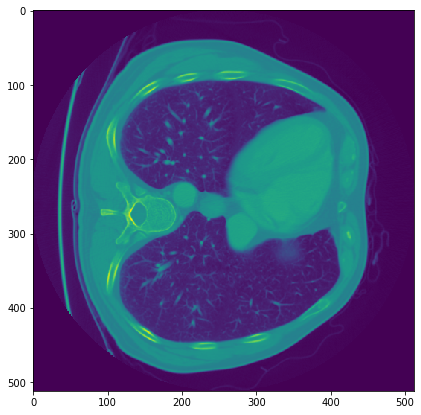

In [74]:
# Rebuild and visualize axials
plt.imshow(build_slice_from_patches(np.squeeze(patches[:,0])))

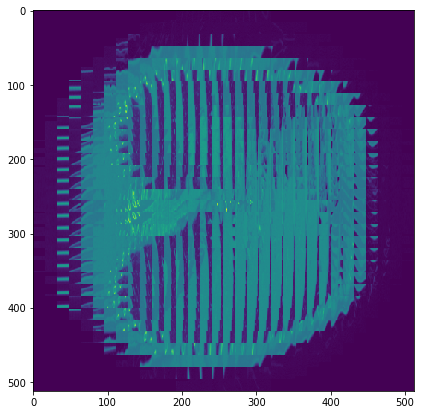

In [75]:
# other planes
plt.imshow(build_slice_from_patches(np.squeeze(patches[:,1])))

In [77]:
# Lset up the convolutional operator

conv25d = nn.Conv2d(
    3, # Input size == 1 
    1, # Output size
    kernel_size = (4, 4), 
    bias = False) 
print(conv25d)

# shape of weights
print(conv25d.weight.shape)

# Set up conv kernel 
conv_kernel25d = np.array([conv_kernel, conv_kernel, conv_kernel])

# Initialize layer parameters with the kernel
# Torch expects parameter vector of size (output_channels, input_channels, kernel x dimension, kernel y dimension)
params = torch.from_numpy(conv_kernel25d).type(torch.FloatTensor).unsqueeze(0)
conv25d.weight = torch.nn.Parameter(params)

Conv2d(3, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
torch.Size([1, 3, 4, 4])


Wall time: 1.22 s


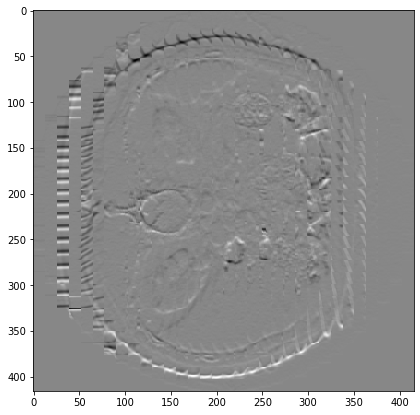

In [78]:
%%time
# Now, run our convolution operation on all the layers:

conv_slices = []
for z in range(img.shape[2]):
    slice_tensor = torch.from_numpy((extract_patches(img, patch_size, z).astype(np.single)/0xff))
    convolved = conv25d(slice_tensor)
    conv_slices.append(np.squeeze(convolved.detach().numpy()))

# Visualize a slice
plt.imshow(build_slice_from_patches(conv_slices[20]), cmap="gray")

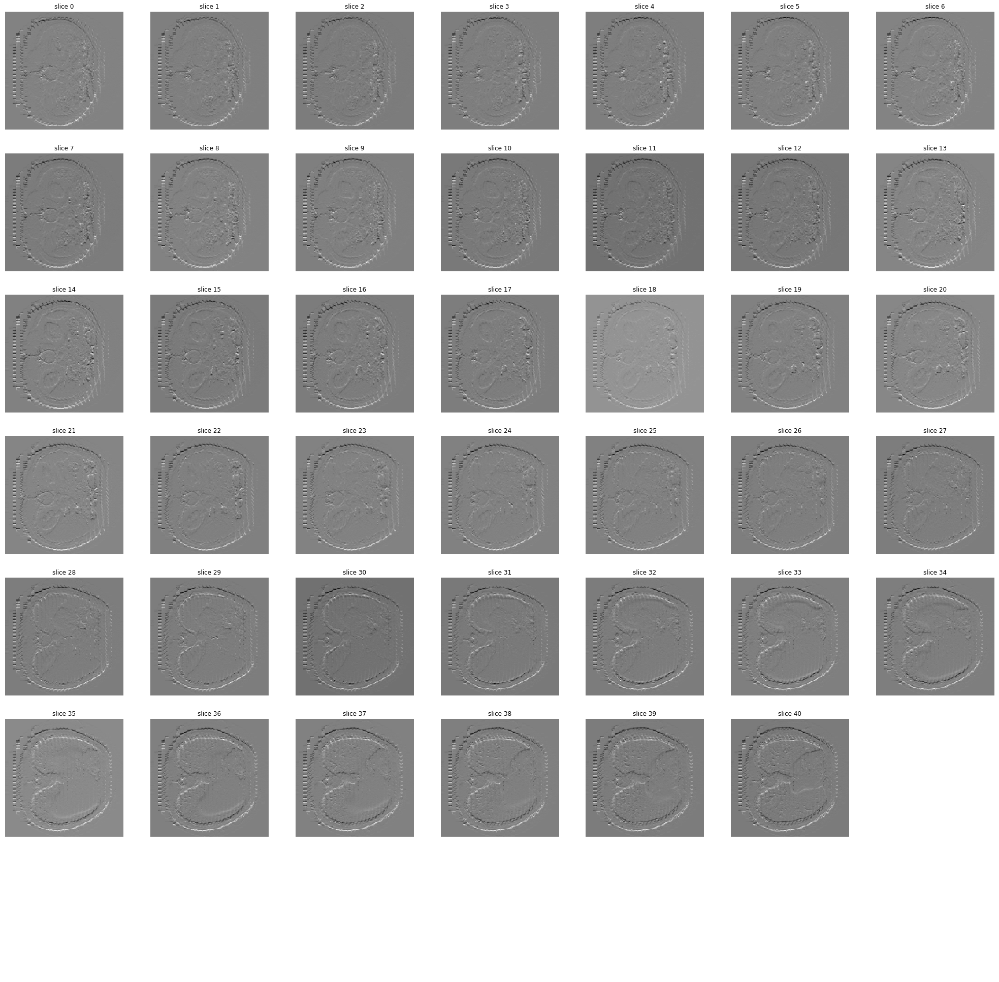

In [47]:
# Visualize more slices
display_volume_slices([build_slice_from_patches(p) for p in conv_slices], 7, 7)

In [79]:
print(f"Number of trainable parameters: {np.prod(conv25d.weight.shape)}")

Number of trainable parameters: 48
